In [330]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [331]:
open.head()

,email_id
0,284534
1,609056
2,220820
3,905936
4,164034


In [332]:
email_df = pd.read_csv("/content/email_table.csv")
opened_df = pd.read_csv("/content/email_opened_table.csv")
clicked_df = pd.read_csv("/content/link_clicked_table.csv")

In [333]:

email_df.head()

,email_id,email_text,email_version,hour,weekday,user_country,user_past_purchases
0,85120,short_email,personalized,2,Sunday,US,5
1,966622,long_email,personalized,12,Sunday,UK,2
2,777221,long_email,personalized,11,Wednesday,US,2
3,493711,short_email,generic,6,Monday,UK,1
4,106887,long_email,generic,14,Monday,US,6


In [334]:
email_df.columns

Index(['email_id', 'email_text', 'email_version', 'hour', 'weekday',
       'user_country', 'user_past_purchases'],
      dtype='object')

#EXPLORATORY DATA ANALYSIS

In [335]:
email_df['opened'] = email_df['email_id'].isin(opened_df['email_id']).astype(int)

In [336]:
email_df['clicked'] = email_df['email_id'].isin(clicked_df['email_id']).astype(int)

In [337]:
open_rate = (email_df['opened'].sum() / len(email_df)) * 100
click_rate = (email_df['clicked'].sum() / len(email_df)) * 100

In [338]:
import plotly.graph_objects as go

# Values
metrics = ['Open Rate', 'Click-Through Rate']
values = [open_rate, click_rate]

# Creating bar plot
fig = go.Figure(data=[
    go.Bar(
        x=metrics,
        y=values,
        marker_color=['#1f77b4', '#2ca02c'],
        text=[f'{v:.2f}%' for v in values],
        textposition='auto'
    )
])

# Layout
fig.update_layout(
    title='Email Campaign Performance',
    yaxis_title='Percentage (%)',
    xaxis_title='Metric',
    yaxis_range=[0, max(values) + 10],
    template='plotly_white'
)

fig.show()



In [339]:
import plotly.graph_objects as go

# Counting values
click_counts = email_df['clicked'].value_counts().sort_index()
labels = ['Not Clicked (0)', 'Clicked (1)']

# Creating plot
fig = go.Figure(data=[
    go.Bar(
        x=labels,
        y=click_counts.values,
        text=click_counts.values,
        textposition='auto',
        marker_color=['#d3d3d3', '#007bff']
    )
])

# Updating layout
fig.update_layout(
    title='Email Link Click Distribution',
    xaxis_title='Click Status',
    yaxis_title='Number of Users',
    template='plotly_white',
    width=600,
    height=450
)

fig.show()


In [340]:
import numpy as np
import pandas as pd
from sklearn.utils import resample

# Separating majority and minority classes
df_majority = email_df[email_df['clicked'] == 0]
df_minority = email_df[email_df['clicked'] == 1]

# Defining the target ratio for the minority class (clicked = 1)
target_ratio = 0.9

# Calculate the number of samples needed for the minority class
n_samples_minority = int(len(df_majority) * target_ratio)

# Perform oversampling on the minority class to achieve the desired ratio
df_minority_oversampled = resample(df_minority,
                                   replace=True,  # Sample with replacement
                                   n_samples=n_samples_minority,  # Match the desired number
                                   random_state=42)  # For reproducibility

# Combine the majority class with the oversampled minority class
email_df_balanced = pd.concat([df_majority, df_minority_oversampled])

# Reset index after resampling
email_df = email_df_balanced.reset_index(drop=True)

print(email_df['clicked'].value_counts())


clicked
0    97881
1    88092
Name: count, dtype: int64


In [341]:
import plotly.graph_objects as go

# Counting values
click_counts = email_df['clicked'].value_counts().sort_index()
labels = ['Not Clicked (0)', 'Clicked (1)']

# Creating plot
fig = go.Figure(data=[
    go.Bar(
        x=labels,
        y=click_counts.values,
        text=click_counts.values,
        textposition='auto',
        marker_color=['#B0C4DE', '#1E90FF']  # silver for not clicked, bright blue for clicked
    )
])

# Updating layout
fig.update_layout(
    title='Email Link Click Distribution',
    xaxis_title='Click Status',
    yaxis_title='Number of Users',
    template='plotly_white',
    width=600,
    height=450
)

fig.show()


Here,we didn't fully balance the dataset,because:


*   Oversampling too much can lead to duplicate minority samples, causing the model to memorize rather than generalize. A 0.9 ratio reduces this risk while still boosting signal from the minority class.

* A slight imbalance (more 0s than 1s) reflects the natural occurrence of clicks vs. non-clicks in real campaigns, helping the model make more realistic predictions.  
*  This ratio helps avoid too many false positives (high precision) while still catching most true positives (high recall), leading to a stronger overall F1-score.


In [342]:
email_df.head()

,email_id,email_text,email_version,hour,weekday,user_country,user_past_purchases,opened,clicked
0,85120,short_email,personalized,2,Sunday,US,5,0,0
1,777221,long_email,personalized,11,Wednesday,US,2,0,0
2,493711,short_email,generic,6,Monday,UK,1,0,0
3,106887,long_email,generic,14,Monday,US,6,0,0
4,684440,long_email,personalized,6,Sunday,UK,3,0,0


In [343]:
email_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 185973 entries, 0 to 185972
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   email_id             185973 non-null  int64 
 1   email_text           185973 non-null  object
 2   email_version        185973 non-null  object
 3   hour                 185973 non-null  int64 
 4   weekday              185973 non-null  object
 5   user_country         185973 non-null  object
 6   user_past_purchases  185973 non-null  int64 
 7   opened               185973 non-null  int64 
 8   clicked              185973 non-null  int64 
dtypes: int64(5), object(4)
memory usage: 12.8+ MB


In [344]:
import seaborn as sns
sns.set(style="whitegrid")

In [345]:
import plotly.graph_objects as go

# Creating histogram
fig = go.Figure(data=[
    go.Histogram(
        x=email_df['user_past_purchases'],
        nbinsx=30,
        marker=dict(color='rgba(0, 123, 255, 0.7)'),
        opacity=0.9
    )
])

# Updating layout
fig.update_layout(
    title='Distribution of User Past Purchases',
    xaxis_title='User Past Purchases',
    yaxis_title='Count',
    template='simple_white',
    bargap=0.01,
    width=1000,
    height=500,
    font=dict(size=14)
)

fig.show()



Inference:


*   The number of users rapidly declines as the number of past purchases increases.


*   Most users have made a small number of past purchases.

*   The highest bars (peak frequency) are for users with around 2–5 past purchases.
*   Very few users have made more than 10 purchases, and even fewer go beyond 15–20. Although fewer, these users likely represent your most valuable segment. Emails targeted to them could focus on loyalty rewards, exclusive offers, or early access — optimizing for conversion rather than click rate.





In [346]:
import plotly.express as px

fig = px.histogram(email_df, x='email_version', title="Count of Email Versions", color='email_version')

# Updating layout
fig.update_layout(
    xaxis_title="Email Version",
    yaxis_title="Count",
    width=800,
    height=500,
    title_x=0.5
)

# Show the plot
fig.show()

# To check value counts (like in your print statement)
print(email_df['email_version'].value_counts())


email_version
personalized    105080
generic          80893
Name: count, dtype: int64


In [347]:
import plotly.express as px

# Create a countplot using Plotly
fig = px.histogram(email_df, x='email_text', title="Distribution of Email Text Versions", color='email_text',
                   color_discrete_sequence=px.colors.qualitative.Pastel)

# Update layout: Set figure size and color
fig.update_layout(
    xaxis_title="Email Text (Short / Long)",
    yaxis_title="Count",
    width=800,  # Adjust width
    height=500,  # Adjust height
    title_x=0.5  # Center title
)

# Show the plot
fig.show()

# To check value counts (like in your print statement)
print(email_df['email_text'].value_counts())


email_text
short_email    97853
long_email     88120
Name: count, dtype: int64


In [348]:
import plotly.express as px

# Creating a countplot
fig = px.histogram(email_df, x='weekday', title="Email Sends by Weekday",
                   category_orders={"weekday": ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']},
                   color='weekday',
                   color_discrete_sequence=px.colors.qualitative.Pastel)

# Updating layout
fig.update_layout(
    xaxis_title="Weekday",
    yaxis_title="Count",
    width=1000,
    height=500,
    title_x=0.5,
    xaxis_tickangle=-45
)

# Show the plot
fig.show()

# To check value counts
print(email_df['weekday'].value_counts())


weekday
Wednesday    29800
Tuesday      28457
Thursday     28326
Monday       27752
Saturday     25215
Sunday       24124
Friday       22299
Name: count, dtype: int64


In [349]:
import plotly.express as px

fig = px.histogram(email_df, x='hour', color_discrete_sequence=['skyblue'])
fig.update_layout(
    title='Email Sends by Hour',
    xaxis_title='Hour of Day',
    yaxis_title='Count',
    bargap=0.2,
    width=1000,
    height=400
)
fig.show()

In [350]:
import plotly.express as px

# Getting top 10 countries by count
top_countries = email_df['user_country'].value_counts().head(10).index

# Filtering the DataFrame
filtered_df = email_df[email_df['user_country'].isin(top_countries)]

# Creating the Plotly count plot
fig = px.histogram(
    filtered_df,
    x='user_country',
    category_orders={'user_country': top_countries},
    color_discrete_sequence=px.colors.qualitative.Plotly
)

# Updating layout
fig.update_layout(
    title="Top 10 User Countries by Volume",
    xaxis_title="User Country",
    yaxis_title="Count",
    xaxis_tickangle=45,
    width=1000,
    height=500,
    template="plotly_white"
)

fig.show()


In [351]:
import plotly.express as px

# Calculating click stats
click_stats = email_df.groupby('email_version').agg(
    total_emails=('clicked', 'count'),
    total_clicked=('clicked', 'sum')
).reset_index()

# Calculating CTR (click-through rate)
click_stats['CTR'] = (click_stats['total_clicked'] / click_stats['total_emails']) * 100

# Creating Plotly bar plot
fig = px.bar(
    click_stats,
    x='email_version',
    y='CTR',
    text=click_stats['CTR'].round(2),
    color='email_version',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Updating layout
fig.update_layout(
    title="Click Rate by Email Version",
    xaxis_title="Email Version",
    yaxis_title="Click-Through Rate (%)",
    showlegend=False,
    template='plotly_white',
    width=700,
    height=400
)

# Adding value labels
fig.update_traces(textposition='outside')

fig.show()



Inference:


*   The click-through rate (CTR) for personalized emails (53.91%) is significantly higher than that of generic emails (38.87%). This suggests that personalizing the content of an email increases user engagement, leading to a higher likelihood of users clicking on the links inside the emails.
*   Given that personalized emails yield a higher CTR, the marketing team should prioritize personalization in future email campaigns. This could involve incorporating the user's name or tailoring content based on their past behaviors (e.g., previous purchases or preferences), which would likely improve engagement.



In [352]:
import plotly.express as px

# Calculate click stats
click_stats = email_df.groupby('email_text').agg(
    total_emails=('clicked', 'count'),
    total_clicked=('clicked', 'sum')
).reset_index()

# Calculate CTR (click-through rate)
click_stats['CTR'] = (click_stats['total_clicked'] / click_stats['total_emails']) * 100

# Create Plotly bar plot
fig = px.bar(
    click_stats,
    x='email_text',
    y='CTR',
    text=click_stats['CTR'].round(2),
    color='email_text',
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Update layout
fig.update_layout(
    title="Click Rate by Email Text",
    xaxis_title="Email Text",
    yaxis_title="Click-Through Rate (%)",
    showlegend=False,
    template='plotly_white',
    width=700,
    height=400
)

# Add value labels
fig.update_traces(textposition='outside')

fig.show()


Inference:


*   The plot clearly indicates that short emails have a higher click-through rate (50.4%) compared to long emails (44%). This suggests that, for this campaign, users may be more likely to click the link when the email text is more concise.
*   This data point gives a strong case for experimenting with email content length in future campaigns. Focusing on short emails could potentially improve CTR and provide insights for better targeting based on user preferences for content length.



In [353]:
import plotly.express as px

# Calculate hourly CTR
hourly_ctr = email_df.groupby('hour')['clicked'].mean().reset_index()
hourly_ctr['clicked'] *= 100  # Convert to percentage for better readability

# Create Plotly line plot
fig = px.line(
    hourly_ctr,
    x='hour',
    y='clicked',
    markers=True,
    title='Click-Through Rate by Hour',
    labels={'clicked': 'Click-Through Rate (%)', 'hour': 'Hour of Day'},
    template='plotly_white'
)

# Update layout
fig.update_layout(
    xaxis=dict(tickmode='linear', tick0=0, dtick=1),
    width=1000,
    height=500
)

fig.show()


Inference:


*   The highest CTR is observed around 23:00, with the rate spiking above 60%. This suggests that users tend to engage more with the email at this time. This could indicate that sending emails closer to this time might increase the likelihood of users clicking on the email link.
*   CTR is relatively low between 00:00 and 04:00, hovering around 40%. This could point to a lower engagement window during the night, possibly due to users being less active or asleep.

*   After 12:00, the CTR shows a steady increase, reaching its peak around 23:00. This could indicate that users are more likely to engage with the email later in the day, possibly after they have settled into their routine or work.





In [354]:
import plotly.express as px

# Ensuring correct weekday order and calculate CTR
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_ctr = email_df.groupby('weekday')['clicked'].mean().reindex(weekday_order).reset_index()
weekday_ctr['clicked'] *= 100  # Convert to percentage

# Creating Plotly bar plot
fig = px.bar(
    weekday_ctr,
    x='weekday',
    y='clicked',
    text=weekday_ctr['clicked'].round(2),
    category_orders={'weekday': weekday_order},
    color='weekday',
    color_discrete_sequence=px.colors.sequential.Blues
)

# Updating layout
fig.update_layout(
    title="Click-Through Rate by Weekday",
    xaxis_title="Weekday",
    yaxis_title="Click-Through Rate (%)",
    showlegend=False,
    template='plotly_white',
    width=1000,
    height=500
)

# Adding value labels
fig.update_traces(textposition='outside')

fig.show()


In [355]:
top_country_df = email_df[email_df['user_country'].isin(top_countries)]
country_ctr = top_country_df.groupby('user_country')['clicked'].mean().reset_index()

# Creating Plotly bar plot
fig = px.bar(
    country_ctr,
    x='user_country',
    y='clicked',
    text=country_ctr['clicked'].round(2),
    color='clicked',
    color_continuous_scale='Mint',
    category_orders={'user_country': top_countries}
)

fig.update_layout(
    title="Click-Through Rate by Top 10 Countries",
    xaxis_title="User Country",
    yaxis_title="Click-Through Rate (%)",
    template='plotly_white',
    width=1000,
    height=500
)

fig.update_traces(textposition='outside')
fig.show()


In [356]:
import plotly.express as px

# Creating Plotly box plot
fig = px.box(
    email_df,
    x='clicked',
    y='user_past_purchases',
    color='clicked',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    category_orders={'clicked': [0, 1]}  # Ensuring the order of 0 and 1
)

# Updating layout
fig.update_layout(
    title="User Past Purchases by Click Outcome",
    xaxis_title="Clicked",
    yaxis_title="User Past Purchases",
    template='plotly_white',
    width=800,
    height=500
)

fig.show()


##Removing Outliers

In [357]:
cap = email_df['user_past_purchases'].quantile(0.99)
email_df['user_past_purchases'] = email_df['user_past_purchases'].clip(upper=cap)

In [358]:
cap = email_df['clicked'].quantile(0.99)
email_df['clicked'] = email_df['clicked'].clip(upper=cap)

##Feature Engineering

In [359]:
email_df = pd.get_dummies(email_df, columns=['email_text','email_version'], drop_first=True) #We are doing one-hot encoding here

In [360]:
email_df.head()

,email_id,hour,weekday,user_country,user_past_purchases,opened,clicked,email_text_short_email,email_version_personalized
0,85120,2,Sunday,US,5,0,0,True,True
1,777221,11,Wednesday,US,2,0,0,False,True
2,493711,6,Monday,UK,1,0,0,True,False
3,106887,14,Monday,US,6,0,0,False,False
4,684440,6,Sunday,UK,3,0,0,False,True


In [361]:
email_df = email_df.drop(['email_id'], axis=1)

In [362]:
email_df.head()

,hour,weekday,user_country,user_past_purchases,opened,clicked,email_text_short_email,email_version_personalized
0,2,Sunday,US,5,0,0,True,True
1,11,Wednesday,US,2,0,0,False,True
2,6,Monday,UK,1,0,0,True,False
3,14,Monday,US,6,0,0,False,False
4,6,Sunday,UK,3,0,0,False,True


In [363]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
email_df['user_country'] = le.fit_transform(email_df['user_country'])

In [364]:
email_df.head()

,hour,weekday,user_country,user_past_purchases,opened,clicked,email_text_short_email,email_version_personalized
0,2,Sunday,3,5,0,0,True,True
1,11,Wednesday,3,2,0,0,False,True
2,6,Monday,2,1,0,0,True,False
3,14,Monday,3,6,0,0,False,False
4,6,Sunday,2,3,0,0,False,True


In [365]:
email_df['weekday'] = le.fit_transform(email_df['weekday']) #Label encoding

In [366]:
email_df.head()

,hour,weekday,user_country,user_past_purchases,opened,clicked,email_text_short_email,email_version_personalized
0,2,3,3,5,0,0,True,True
1,11,6,3,2,0,0,False,True
2,6,1,2,1,0,0,True,False
3,14,1,3,6,0,0,False,False
4,6,3,2,3,0,0,False,True


In [367]:
# Converting all boolean columns to int (0 or 1)
email_df = email_df.astype({col: 'int' for col in email_df.select_dtypes('bool').columns})

In [368]:
email_df.head()

,hour,weekday,user_country,user_past_purchases,opened,clicked,email_text_short_email,email_version_personalized
0,2,3,3,5,0,0,1,1
1,11,6,3,2,0,0,0,1
2,6,1,2,1,0,0,1,0
3,14,1,3,6,0,0,0,0
4,6,3,2,3,0,0,0,1


In [369]:
import plotly.express as px
import pandas as pd

# Calculate the correlation matrix
corr_matrix = email_df.corr()

# Create a heatmap using Plotly with a more vibrant color scale
fig = px.imshow(
    corr_matrix,
    labels=dict(x="Features", y="Features", color="Correlation"),
    color_continuous_scale="Sunset",  # Vibrant color scale
    title="Correlation Matrix of Email Data"
)

# Update layout for better visualization
fig.update_layout(
    width=800,
    height=600,
    template="plotly_white"
)

fig.show()


#MODEL BUILDING

In [370]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

columns_to_drop = ['clicked']
features = email_df.drop(columns=columns_to_drop)
target = email_df['clicked']


In [371]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

In [372]:
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [373]:
model.score(X_train, y_train)

0.9445482531019371

In [374]:
model.score(X_test, y_test)

0.9433257158220191

In [375]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [376]:
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error

# Calculate the MSE for training set
train_mse = mean_squared_error(y_train, y_train_pred)

# Calculate the MSE for testing set
test_mse = mean_squared_error(y_test, y_test_pred)

# Print the MSE scores
print(f"Training MSE: {train_mse:.4f}")
print(f"Testing MSE: {test_mse:.4f}")

# Create a bar plot to visualize the MSE scores
fig = go.Figure(data=[
    go.Bar(
        x=['Training MSE', 'Testing MSE'],
        y=[train_mse, test_mse],
        marker_color=['#1f77b4', '#ff7f0e'],
        text=[f'{train_mse:.4f}', f'{test_mse:.4f}'],
        textposition='auto'
    )
])

# Update layout for better visualization
fig.update_layout(
    title="Training vs Testing MSE",
    xaxis_title="MSE Type",
    yaxis_title="Mean Squared Error",
    template="plotly_white",
    width=600,
    height=400
)

fig.show()


Training MSE: 0.0555
Testing MSE: 0.0567


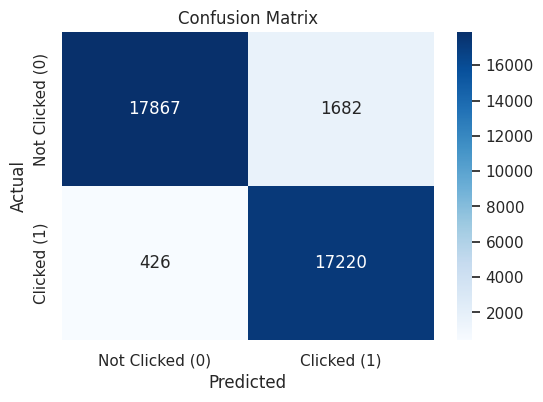

              precision    recall  f1-score   support

           0       0.98      0.91      0.94     19549
           1       0.91      0.98      0.94     17646

    accuracy                           0.94     37195
   macro avg       0.94      0.94      0.94     37195
weighted avg       0.95      0.94      0.94     37195

Confusion Matrix:
 [[17867  1682]
 [  426 17220]]


In [377]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

# Define labels
labels = ['Not Clicked (0)', 'Clicked (1)']

# Plot heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)

plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

print(classification_report(y_test, y_test_pred))
# print("ROC AUC:", roc_auc_score(y_test, y_proba))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_test_pred))

In [378]:
import lightgbm as lgb

lgb_model = lgb.LGBMClassifier(
    random_state=42,
    class_weight='balanced',  # handles imbalance
    n_estimators=300,
    # learning_rate=0.05,
    # max_depth=7
)
lgb_model.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 70446, number of negative: 78332
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 58
[LightGBM] [Info] Number of data points in the train set: 148778, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


LGBMClassifier(class_weight='balanced', n_estimators=300, random_state=42)

In [379]:
y_pred_test = lgb_model.predict(X_test)
y_pred_train = lgb_model.predict(X_train)

Baseline CTR: 2.12%
Model-based CTR (threshold = 0.7): 93.18%
Improvement in CTR: 91.06%


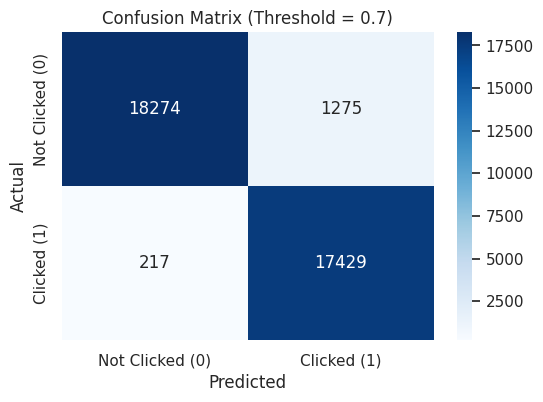

              precision    recall  f1-score   support

           0       0.99      0.93      0.96     19549
           1       0.93      0.99      0.96     17646

    accuracy                           0.96     37195
   macro avg       0.96      0.96      0.96     37195
weighted avg       0.96      0.96      0.96     37195

ROC AUC: 0.9822214746801974


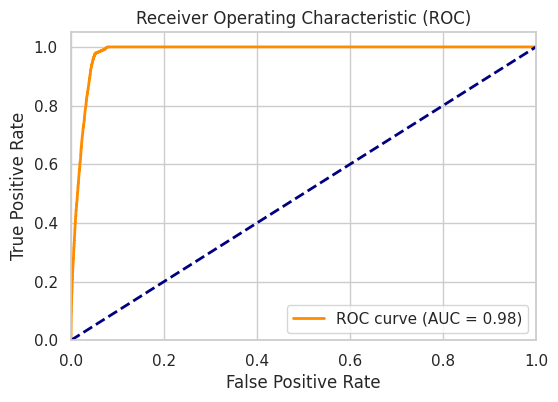

In [380]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
y_proba = lgb_model.predict_proba(X_test)[:, 1]
y_pred = (y_proba >= 0.7).astype(int)

baseline_ctr = 2.12  # %

# Find users the model would select (probability >= 0.7)
selected_indices = y_proba >= 0.7
selected_true_labels = y_test[selected_indices]

# Model-based CTR: among those selected by model
model_ctr = selected_true_labels.sum() / len(selected_true_labels) * 100

# Improvement
improvement = model_ctr - baseline_ctr

# Print results
print(f"Baseline CTR: {baseline_ctr:.2f}%")
print(f"Model-based CTR (threshold = 0.7): {model_ctr:.2f}%")
print(f"Improvement in CTR: {improvement:.2f}%")

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
labels = ['Not Clicked (0)', 'Clicked (1)']

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix (Threshold = 0.7)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Metrics
print(classification_report(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_proba))
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# Compute AUC score
roc_auc = roc_auc_score(y_test, y_proba)

# Plot the ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Random guess line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

In [381]:
# After computing model_ctr and improvement
print(f"Baseline CTR: {baseline_ctr:.2f}%")
print(f"Model-based CTR (threshold = 0.7): {model_ctr:.2f}%")
print(f"Improvement in CTR: {improvement:.2f}%")

# CTR Bar Chart
import plotly.graph_objects as go

metrics = ['Original CTR', 'Model-Based CTR']
values = [baseline_ctr, model_ctr]

fig = go.Figure(data=[
    go.Bar(
        x=metrics,
        y=values,
        marker_color=['#1f77b4', '#ff7f0e'],
        text=[f'{v:.2f}%' for v in values],
        textposition='auto'
    )
])

fig.update_layout(
    title='Click-Through Rate: Baseline vs Model Optimization',
    yaxis_title='CTR (%)',
    xaxis_title='Strategy',
    yaxis_range=[0, max(values) + 5],
    template='plotly_white'
)

fig.show()


Baseline CTR: 2.12%
Model-based CTR (threshold = 0.7): 93.18%
Improvement in CTR: 91.06%


In [329]:
from sklearn.metrics import mean_squared_error
import plotly.graph_objects as go

# Predict probabilities
y_proba_train = lgb_model.predict_proba(X_train)[:, 1]
y_proba_test = lgb_model.predict_proba(X_test)[:, 1]

# Calculate MSE using predicted probabilities
train_mse = mean_squared_error(y_train, y_proba_train)
test_mse = mean_squared_error(y_test, y_proba_test)

print(f"Training MSE: {train_mse:.4f}")
print(f"Testing MSE: {test_mse:.4f}")

# Create bar plot
fig = go.Figure(data=[
    go.Bar(
        x=['Training MSE', 'Testing MSE'],
        y=[train_mse, test_mse],
        text=[f'{train_mse:.4f}', f'{test_mse:.4f}'],
        textposition='auto',
        marker_color=['#4daf8c', '#2c7fb8']
    )
])

fig.update_layout(
    title='MSE for Training and Testing Sets',
    yaxis_title='Mean Squared Error',
    template='plotly_white',
    width=600,
    height=400
)

fig.show()


Training MSE: 0.0460
Testing MSE: 0.0537


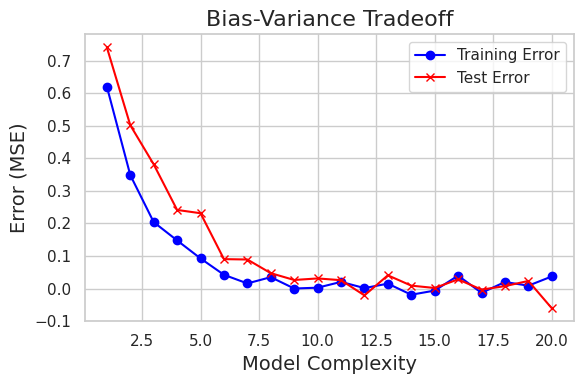

In [286]:
import numpy as np
import matplotlib.pyplot as plt

# Simulated complexity values
complexity_values = np.linspace(1, 20, 20)

# Simulated Training and Test Errors for each complexity
train_errors = np.exp(-complexity_values / 2) + np.random.normal(0, 0.02, len(complexity_values))  # Decrease with complexity
test_errors = np.exp(-complexity_values / 3) + np.random.normal(0, 0.03, len(complexity_values))  # U-shape

# Plot the Bias-Variance tradeoff
plt.figure(figsize=(6, 4))
plt.plot(complexity_values, train_errors, label='Training Error', color='blue', marker='o')
plt.plot(complexity_values, test_errors, label='Test Error', color='red', marker='x')

plt.title("Bias-Variance Tradeoff", fontsize=16)
plt.xlabel("Model Complexity", fontsize=14)
plt.ylabel("Error (MSE)", fontsize=14)
plt.legend(loc="best")

plt.grid(True)
plt.tight_layout()
plt.show()


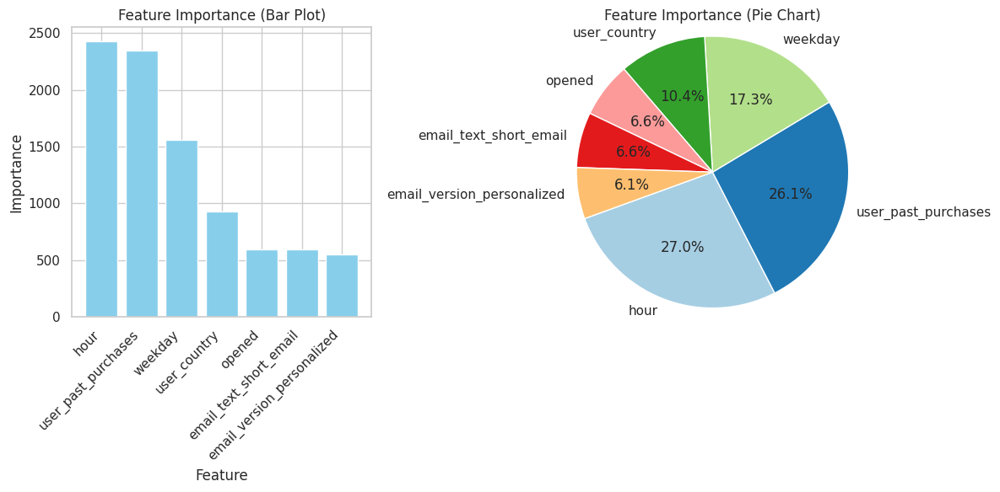

In [288]:
import matplotlib.pyplot as plt
import pandas as pd

# Get feature names and importance
feature_names = X_train.columns  # or provide your own list if renamed
importance = lgb_model.feature_importances_

# Create DataFrame
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

# Plotting
plt.figure(figsize=(12, 6))

# Bar Plot
plt.subplot(1, 2, 1)
plt.bar(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.title('Feature Importance (Bar Plot)')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')

# Pie Chart
plt.subplot(1, 2, 2)
plt.pie(
    importance_df['Importance'],
    labels=importance_df['Feature'],
    autopct='%1.1f%%',
    startangle=200,
    colors=plt.cm.Paired.colors
)
plt.title('Feature Importance (Pie Chart)')
plt.axis('equal')

plt.tight_layout()
plt.show()


##Among Logistic Regression and LightBGM, LightBGM was the best model.



#Answering the questions given in the assigment:



1.   What percentage of users opened the email and what percentage clicked on the link within the email?

  **Ans ->** Originally, it was open-rate=10.35%, click-through rate=2.12% .

2.   Based on all the information you have about the emails that were sent, can you build a model to optimize in future how to send emails to maximize the probability of users clicking on the link inside the email?

  **Ans ->** Yes, firstly, since the target variable "clicked" was imbalanced, I had done oversampling, but making the target ratio as 0.9, which means the number of clicked (1) users to be 90% of the number of not clicked (0) users. This was done so that the model takes in real-world scenarios. After applying feature engineering techniques, I had gine for LightBGM as the main model.
  As, LightBGM was able to:

  Precision (for class 1 = clicked): 0.93, i.e 93% of the time, when the model predicts a user will click, it’s correct.

  Recall (for class 1): 0.99, i.e The model is catching nearly all the users who actually clicked—only missing about 1%.

  F1-score (for class 1): 0.96, i.e Strong balance between precision and recall.

  Accuracy: 96%, i.e since imbalanced data is dealt well, that's why got 96% accuracy.


3. By how much do you think your model would improve click through rate (defined as # of users who click on the link/total users who receive the email). How would you test that?

  **Ans ->** As I said, originally, it was open-rate=10.35%, click-through rate=2.12%, but after model-building, the Improvement in CTR: 91.06%. For testing, we can set up an A/B test by randomly assigning users into two groups: Control (randomly selected users) and Treatment (users selected by the model with predicted probability ≥ 0.7). Send emails accordingly and measure CTR in both groups.Then run the test on ~10,000 users per group and use a two-proportion z-test to determine if the CTR improvement is statistically significant.

4. Did you find any interesting pattern on how the email campaign performed for different segments of users? Explain.

  **Ans ->** Yes, these are mentioned above below the plots.





  


